<a href="https://colab.research.google.com/github/hbeck118/HOC-Project/blob/main/hoc_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The setup and basis for this code is copied from map.ipynb by theaok

#Setup

In [ ]:
%%capture
!pip install geopandas==1.0.1
!pip install mapclassify
!pip install osmnx
%pip install contextily

In [ ]:
import os, zipfile
import pandas as pd
import matplotlib.pyplot as plt

import geopandas as gpd

import mapclassify

import seaborn as sns

#will display all output not just last command
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from google.colab import files

from google.colab.data_table import DataTable
DataTable.max_columns = 250

In [ ]:
#!python --version
gpd.__version__

'1.0.1'

#Importing and Editing Geodataframe and Data

In [ ]:
#code for gdowm from chatgpt
#Importing camden county parcels shapefile from https://njogis-newjersey.opendata.arcgis.com/documents/90a1ce759ecb4d36a4b8d1b9d117556e/about
!pip install -q gdown
import gdown

gdown.download(id='1q66zIbmgSQ__CzDA0PFPE6m_eCUNcUfK', output='parcels_cam.zip', quiet=False)
with zipfile.ZipFile('parcels_cam.zip', 'r') as zip_ref:
    zip_ref.extractall()

cam_par = gpd.read_file('CamdenCountyParcels.shp')

Downloading...
From (original): https://drive.google.com/uc?id=1q66zIbmgSQ__CzDA0PFPE6m_eCUNcUfK
From (redirected): https://drive.google.com/uc?id=1q66zIbmgSQ__CzDA0PFPE6m_eCUNcUfK&confirm=t&uuid=409a95e1-e073-4ca3-adaf-46d4cd977c8c
To: /content/parcels_cam.zip
100%|██████████| 37.0M/37.0M [00:00<00:00, 53.8MB/s]


'parcels_cam.zip'

In [ ]:
#converting Block and Lot numbers for shapefile to floats for merging
cam_par['BLOCK'] = pd.to_numeric(cam_par['BLOCK'], errors='coerce')
cam_par['LOT'] = pd.to_numeric(cam_par['LOT'], errors='coerce')

In [ ]:
#uploading shapefile of Camden County municipalties and isolating Camden City, data from https://camdencountynj-ccdpw.opendata.arcgis.com/datasets/9bea5658edfa490c9d00f98fd9efb6d6_0/explore?location=39.902529%2C-75.078044%2C12.58
! wget -q -O camden_mun.zip https://docs.google.com/uc?id=1n1d2jnI1ty0NrE23rttSQ8t4gh_tYDPU&export=download

zip_ref = zipfile.ZipFile('camden_mun.zip', 'r'); zip_ref.extractall(); zip_ref.close()
cam_bound=gpd.read_file('Municipalities.shp')
cam_city = cam_bound.iloc[[7]]

In [ ]:
cam_city.head(2)

,FID,COUSUBNS,GEOID,NAMELSAD,CLASSFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,GEOCODE,GlobalID,Shape__Are,Shape__Len,geometry
7,8,00885177,3400710000,Camden city,C5,F,23106182,3676392,+39.9367868,-75.1066438,28004.054276,3400710000,f5c8c982-1593-4592-a38a-485a23bd7d98,2.676122e+07,28004.054367,"POLYGON ((493032.266 4419551.728, 492897.768 4..."


In [ ]:
cam_bound.head(4)

,FID,COUSUBNS,GEOID,NAMELSAD,CLASSFP,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,GEOCODE,GlobalID,Shape__Are,Shape__Len,geometry
0,1,00885144,3400702200,Audubon borough,C5,F,3838781,35535,+39.8901277,-75.0723825,9407.757950,3400702200,81d661c6-35a7-42ed-8afd-5f35d0b0e807,3.871214e+06,9407.757866,"POLYGON ((495599.23 4415536.249, 495508.749 44..."
1,2,00885145,3400702230,Audubon Park borough,C5,F,389606,46935,+39.8968373,-75.0888190,2734.677596,3400702230,f8ccbea8-76dd-44e7-992b-e367d22e31a1,4.361934e+05,2734.677499,"POLYGON ((492866.221 4416337.872, 492855.687 4..."
2,3,00885149,3400703250,Barrington borough,C5,F,4095340,0,+39.8689349,-75.0513618,11456.984021,3400703250,9e9086b1-16e4-429f-b5c4-d967de1dbd82,4.092067e+06,11456.984073,"POLYGON ((496819.374 4414558.505, 496827.878 4..."
3,4,00885154,3400704750,Bellmawr borough,C5,F,7729295,315734,+39.8663560,-75.0946695,18085.471872,3400704750,bdd07346-3ee8-471e-befd-b8b9e16eb0a9,8.038608e+06,18085.472003,"POLYGON ((492951.896 4413667.751, 492968.147 4..."


In [ ]:
#clipping the parcels dataset to only parcels within camden city
cam_par = cam_par.to_crs(cam_city.crs)
clip_city = gpd.clip(cam_par, cam_city)

In [ ]:
clip_city

,PAMS_PIN,MUN,BLOCK,LOT,QCODE,LASTUPDATE,geometry
199621,0416_3.01_15,0416,3.01,15.00,None,NaT,"MULTIPOLYGON (((491514.794 4416590.254, 491523..."
89307,0414_241_1.01,0414,241.00,1.01,None,NaT,"MULTIPOLYGON (((491353.924 4416538.218, 491353..."
120293,0416_3.07_6,0416,3.07,6.00,None,NaT,"MULTIPOLYGON (((491353.929 4416538.259, 491363..."
24868,0408_731_1,0408,731.00,1.00,None,NaT,"POLYGON ((491408.595 4417125.244, 491399.469 4..."
24875,0408_731_7,0408,731.00,7.00,None,NaT,"POLYGON ((491436.244 4417141.878, 491441.351 4..."
...,...,...,...,...,...,...,...
26079,0408_888_10.02,0408,888.00,10.02,None,NaT,"POLYGON ((492407.715 4423897.316, 492308.921 4..."
39403,0408_896_3,0408,896.00,3.00,None,NaT,"POLYGON ((492460.825 4423886.751, 492479.038 4..."
39405,0408_896_4,0408,896.00,4.00,None,NaT,"POLYGON ((492479.038 4423888.343, 492485.109 4..."
39406,0408_896_5,0408,896.00,5.00,None,NaT,"POLYGON ((492485.109 4423888.874, 492491.18 44..."


In [ ]:
clip_city.dtypes

,0
PAMS_PIN,object
MUN,object
BLOCK,float64
LOT,float64
QCODE,object
LASTUPDATE,datetime64[ms]
geometry,geometry


In [ ]:
#addint data collected by Heart of Camden about lots in Camden neighborhood Waterfront South (last updated 8/4/25)
#data now has multiple tabs, code to just read a specific tab from https://stackoverflow.com/questions/26521266/using-pandas-to-pd-read-excel-for-multiple-but-not-all-worksheets-of-the-sam
dataHOC=pd.read_excel('https://docs.google.com/uc?id=17twWN--deTjKyMMvnEjfXelvO6kBjaUO&export=download', 'All Parcels (2025)')

In [ ]:
dataHOC

,Status,name,Block,Lot,Owner,Owneraddress,OwnerAddressSameasLocation,LienAmount,LienHolder,InfoverifiedbyCityOPRA,Size,AcquisitionType,AcquisitionStatus,Notes,LastSaleDate,PropertyClass,Other,FloodZone,HistoricDistrict,Zoning
0,Vacant Lot,1441 S 4th St,279.0,8.0,"PADIN-MONTALVO, MARIELYS","1439 SO 4TH STREET, CAMDEN, NJ 08104",no,-,NaN,no,NaN,NaN,NaN,NaN,NaN,15C-Public Property,NaN,NaN,NaN,NaN
1,Vacant Building,1443 S 4th St,279.0,81.0,BERGEN SQ COMMUNITY DEV COALITION,"PO BOX 445, CAMDEN, NJ 08101",no,21000,"CSA Homes LLC, Lillian Zhang",no,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Vacant Lot,1445 S 4th St,279.0,82.0,"SMITH, PEARL","1445 S 4th St CAMDEN, NJ 08104-1338",yes,52693.79,City of Camden,no,NaN,NaN,NaN,NaN,1997,NaN,856-963-7338? Maybe,NaN,NaN,NaN
3,Vacant Lot,434 Lansdowne,342.0,89.0,FIRST CHURCH OF DELIVERANCE,"PO BOX 1419, CAMDEN, NJ 08105",no,-,NaN,no,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Vacant Building,1436 S 4th St,342.0,107.0,"KANELSKY, CHANA","1436 SO 4TH STREET, CAMDEN, NJ 08104",yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1047,NaN,NaN,500.0,41.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no data but needs to be included to make map c...,NaN,NaN,NaN,NaN,NaN,NaN
1048,NaN,NaN,501.0,20.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no data but needs to be included to make map c...,NaN,NaN,NaN,NaN,NaN,NaN
1049,NaN,NaN,501.0,30.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no data but needs to be included to make map c...,NaN,NaN,NaN,NaN,NaN,NaN
1050,NaN,NaN,501.0,31.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no data but needs to be included to make map c...,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
clip_city.dtypes

,0
PAMS_PIN,object
MUN,object
BLOCK,float64
LOT,float64
QCODE,object
LASTUPDATE,datetime64[ms]
geometry,geometry


In [ ]:
dataHOC.dtypes

,0
Status,object
name,object
Block,float64
Lot,float64
Owner,object
Owneraddress,object
OwnerAddressSameasLocation,object
LienAmount,object
LienHolder,object
InfoverifiedbyCityOPRA,object


In [ ]:
cam_par.dtypes

,0
PAMS_PIN,object
MUN,object
BLOCK,float64
LOT,float64
QCODE,object
LASTUPDATE,datetime64[ms]
geometry,geometry


In [ ]:
cam_par2 = clip_city.rename(columns={'BLOCK': 'Block', 'LOT': 'Lot'})

In [ ]:
cam_par2.dtypes

,0
PAMS_PIN,object
MUN,object
Block,float64
Lot,float64
QCODE,object
LASTUPDATE,datetime64[ms]
geometry,geometry


#Merging and Setting Up Mapping

In [ ]:
HOCmap = pd.merge(dataHOC, cam_par2, on=['Block', 'Lot'],how='outer',indicator='merge')
HOCmap[['Block','Lot','merge', 'Status', 'LienAmount']]

HOCmap1 = pd.merge(dataHOC, cam_par2, on=['Block', 'Lot'],how='inner',indicator=False)

,Block,Lot,merge,Status,LienAmount
0,1.00,1.0,right_only,NaN,NaN
1,1.01,10.0,right_only,NaN,NaN
2,2.00,2.0,right_only,NaN,NaN
3,2.00,12.0,right_only,NaN,NaN
4,2.00,16.0,right_only,NaN,NaN
...,...,...,...,...,...
32697,6709.00,7.0,right_only,NaN,NaN
32698,6710.00,1.0,right_only,NaN,NaN
32699,6710.00,6.0,right_only,NaN,NaN
32700,NaN,NaN,left_only,Vacant Building,NaN


In [ ]:
HOCmap1

,Status,name,Block,Lot,Owner,Owneraddress,OwnerAddressSameasLocation,LienAmount,LienHolder,InfoverifiedbyCityOPRA,...,PropertyClass,Other,FloodZone,HistoricDistrict,Zoning,PAMS_PIN,MUN,QCODE,LASTUPDATE,geometry
0,Vacant Building,1443 S 4th St,279.0,81.0,BERGEN SQ COMMUNITY DEV COALITION,"PO BOX 445, CAMDEN, NJ 08101",no,21000,"CSA Homes LLC, Lillian Zhang",no,...,NaN,NaN,NaN,NaN,NaN,0408_279_81,0408,None,NaT,"POLYGON ((489596 4419777.579, 489574.996 44197..."
1,Vacant Lot,1445 S 4th St,279.0,82.0,"SMITH, PEARL","1445 S 4th St CAMDEN, NJ 08104-1338",yes,52693.79,City of Camden,no,...,NaN,856-963-7338? Maybe,NaN,NaN,NaN,0408_279_82,0408,None,NaT,"POLYGON ((489596.403 4419773.347, 489575.775 4..."
2,Vacant Lot,434 Lansdowne,342.0,89.0,FIRST CHURCH OF DELIVERANCE,"PO BOX 1419, CAMDEN, NJ 08105",no,-,NaN,no,...,NaN,NaN,NaN,NaN,NaN,0408_342_89,0408,None,NaT,"POLYGON ((489674.231 4419799.777, 489699.408 4..."
3,Vacant Building,1436 S 4th St,342.0,107.0,"KANELSKY, CHANA","1436 SO 4TH STREET, CAMDEN, NJ 08104",yes,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0408_342_107,0408,None,NaT,"POLYGON ((489635.58 4419797.025, 489635.69 441..."
4,Vacant Building,1438 S 4th St,342.0,108.0,"BOSTON, MABLE & BOSTON, ERNEST JR","1438 SO 4TH STREET,CAMDEN, NJ 08104",yes,24000,City of Camden,no,...,NaN,NaN,NaN,NaN,NaN,0408_342_108,0408,None,NaT,"POLYGON ((489614.024 4419783.643, 489613.637 4..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1031,NaN,NaN,500.0,41.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0408_500_41,0408,None,NaT,"POLYGON ((489805.969 4418721.262, 489805.568 4..."
1032,NaN,NaN,501.0,20.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0408_501_20,0408,None,NaT,"POLYGON ((489826.064 4418824.435, 489829.972 4..."
1033,NaN,NaN,501.0,30.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0408_501_30,0408,None,NaT,"POLYGON ((489840.864 4418783.56, 489840.777 44..."
1034,NaN,NaN,501.0,31.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0408_501_31,0408,None,NaT,"POLYGON ((489840.777 4418779.6, 489840.69 4418..."


In [ ]:
type(HOCmap1)

pandas.core.frame.DataFrame

In [ ]:
HOCmap2 = gpd.GeoDataFrame(HOCmap1)

In [ ]:
HOCmap2.dtypes

,0
Status,object
name,object
Block,float64
Lot,float64
Owner,object
Owneraddress,object
OwnerAddressSameasLocation,object
LienAmount,object
LienHolder,object
InfoverifiedbyCityOPRA,object


In [ ]:
HOCmap2['LienAmount'] = pd.to_numeric(HOCmap2['LienAmount'], errors='coerce')

#Static Maps

<Axes: >

<Axes: >

[]

[]

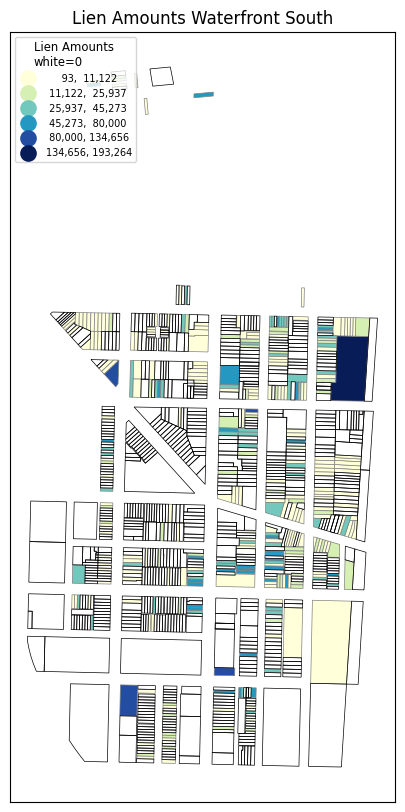

In [ ]:

fig, ax = plt.subplots(1, figsize=(6,10))
HOCmap2.plot(ax=ax,column='LienAmount',legend=True,cmap='YlGnBu',
          scheme="natural_breaks", k=6, edgecolor='grey',linewidth=0.5,
          legend_kwds= {"fmt": "{:,.0f}",'loc':'upper left', 'markerscale':1.2,'title_fontsize':'small','fontsize':'7'})
leg1 = ax.get_legend()
leg1.set_title('''Lien Amounts \nwhite=0''')

missing = HOCmap2[HOCmap2['LienAmount'].isna()]
missing.boundary.plot(ax=ax, color='black', linewidth=0.5)

ax.title.set_text("Lien Amounts Waterfront South")
ax.set_xticks([]) #kills xticks
ax.set_yticks([]) #kills xticks

###Adding basemaps

<Axes: >

(-8362663.577103756, -8361945.641501923)

(4854081.441443107, 4855524.066587218)

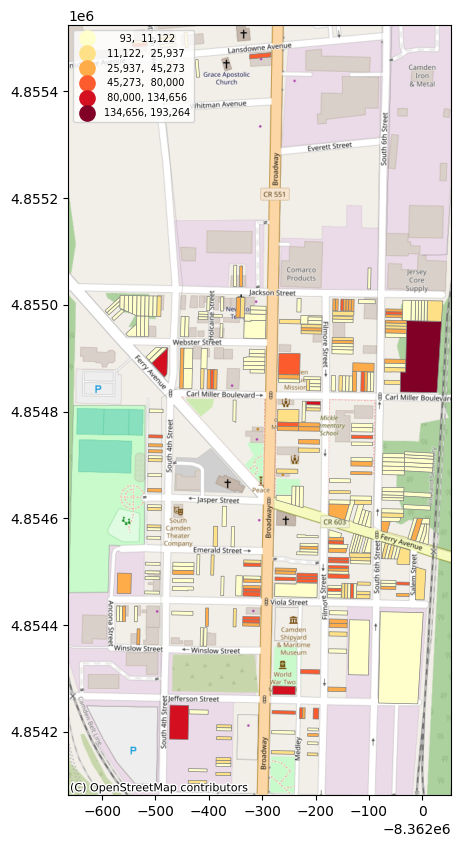

In [ ]:
#code for contextly adjusted from ChatGPT and https://dlab.berkeley.edu/news/adding-basemaps-python-contextily
#basemap from openstreetmaps

import contextily as ctx

HOCmap2 = HOCmap2.to_crs(epsg=3857)
xmin, ymin, xmax, ymax = HOCmap2.total_bounds

fig, ax = plt.subplots(figsize=(10, 10))
HOCmap2.plot(ax=ax,column='LienAmount',legend=True,cmap='YlOrRd',
          scheme="natural_breaks", k=6, edgecolor='grey',linewidth=0.5,
          legend_kwds= {"fmt": "{:,.0f}",'loc':'upper left', 'markerscale':1.2,'title_fontsize':'small','fontsize':'7'})
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)
plt.show()



###Splitting area around lansdowne ave into separate map

In [ ]:
#splitting off northern area from main map
#code adapted from ChatGPT

lansdowne_address = ["1443 S 4th St", "1445 S 4th St","1436 S 4th St", "1438 S 4th St", "1440 S 4th St", "1444 S 4th St", "1446 S 4th St", "417 Lansdowne Ave", "434 Lansdowne ", "422 Lansdowne Ave", "1451 Broadway Ave"]

lansdowne_area = HOCmap2[HOCmap2['name'].isin(lansdowne_address)]
wf_south = HOCmap2[~HOCmap2['name'].isin(lansdowne_address)]

<Axes: >

Text(0.5, 1.0, 'Waterfront South')

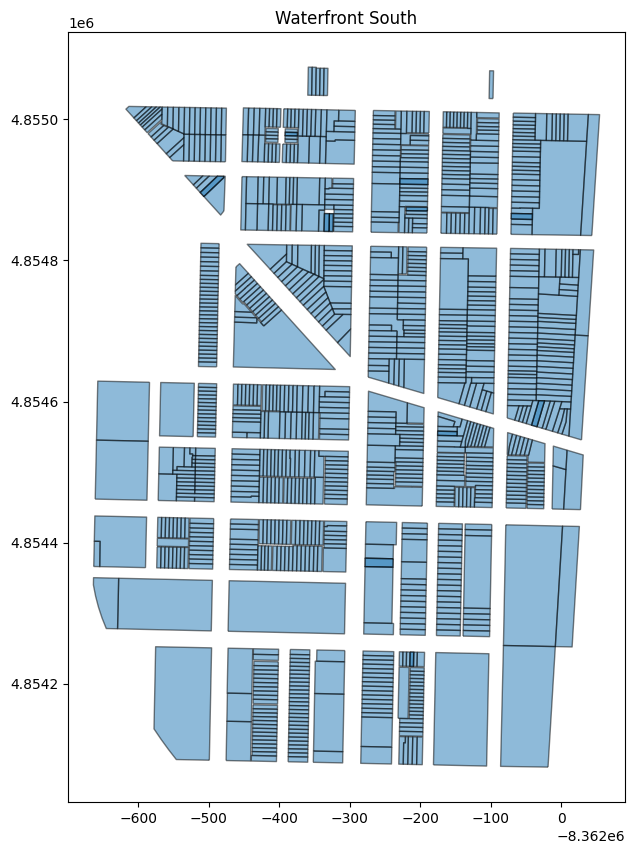

<Axes: >

Text(0.5, 1.0, 'Lansdowne Ave')

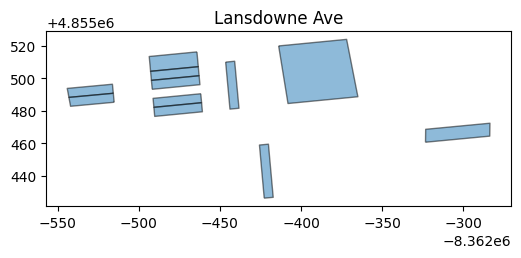

In [ ]:
fig, ax = plt.subplots(1, figsize=(10, 10))
wf_south.plot(ax=ax, alpha=0.5, edgecolor='black')
plt.title("Waterfront South")
plt.show()

fig, ax = plt.subplots(1, figsize=(6, 6))
lansdowne_area.plot(ax=ax, alpha=0.5, edgecolor='black')
plt.title("Lansdowne Ave")
plt.show()

<Axes: >

(-8362663.577103756, -8361945.641501923)

(4854081.441443107, 4855074.278317256)

Text(0.5, 1.0, 'Camden Waterfront South')

<Axes: >

(-8362544.070359673, -8362283.603444299)

(4855426.219170547, 4855524.066587218)

[]

[]

Text(0.5, 1.0, 'Area Around Lansdowne Ave')

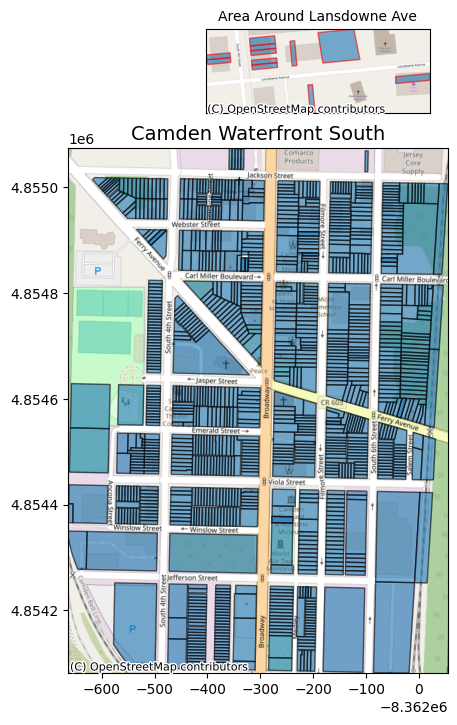

In [ ]:
#adding area around lansdowne as a small map above main map

import matplotlib.pyplot as plt
import contextily as ctx

fig = plt.figure(figsize=(6, 7))
main_ax = fig.add_axes([0.1, 0.1, 0.8, 0.75])

# Plot main area and adding basemap from openstreetmap
wf_south.plot(ax=main_ax, alpha=0.6, edgecolor='black')
ctx.add_basemap(main_ax, source=ctx.providers.OpenStreetMap.Mapnik)

main_ax.set_xlim(*wf_south.total_bounds[[0, 2]])
main_ax.set_ylim(*wf_south.total_bounds[[1, 3]])
main_ax.set_title("Camden Waterfront South", fontsize=14)

# Create separate inset are for smaller map
inset_ax = fig.add_axes([0.4, 0.9, 0.4, 0.12])  # [left, bottom, width, height]

# Plot detached area and adding basemap from openstreetmap
lansdowne_area.plot(ax=inset_ax, alpha=0.6, edgecolor='red')
ctx.add_basemap(inset_ax, source=ctx.providers.OpenStreetMap.Mapnik)

inset_ax.set_xlim(*lansdowne_area.total_bounds[[0, 2]])
inset_ax.set_ylim(*lansdowne_area.total_bounds[[1, 3]])

inset_ax.set_xticks([])
inset_ax.set_yticks([])
inset_ax.set_title("Area Around Lansdowne Ave", fontsize=10)

plt.show()

###Lien amounts map

In [ ]:
HOCmap2['LienAmount'].max()
HOCmap2['LienAmount'].min()

193263.59

93.38

<Axes: >

(-8362663.577103756, -8361945.641501923)

(4854081.441443107, 4855074.278317256)

Text(0.5, 1.0, 'Lien Amounts Waterfront South')

<Axes: title={'center': 'Lien Amounts Waterfront South'}>

<Axes: >

(-8362544.070359673, -8362283.603444299)

(4855426.219170547, 4855524.066587218)

[]

[]

Text(0.5, 1.0, 'Area Around Lansdowne Ave')

<Axes: title={'center': 'Area Around Lansdowne Ave'}>

[]

[]

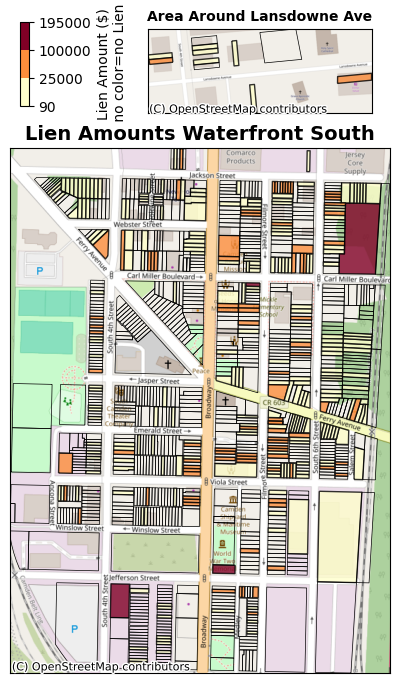

In [ ]:
#code for shared legend and inset adjusted from ChatGPT

import matplotlib.cm as cm
import matplotlib.colors as colors

#setting up colorcoding and legend

bounds = [90, 25000, 100000, 195000] #bins based on Mike's preferences
vmin = min(wf_south['LienAmount'].min(), lansdowne_area['LienAmount'].min())
vmax = max(wf_south['LienAmount'].max(), lansdowne_area['LienAmount'].max())
cmap = plt.cm.YlOrRd
norm = colors.BoundaryNorm(boundaries=bounds, ncolors=cmap.N, clip=True)

# Create figure and main axis
fig = plt.figure(figsize=(6, 7))
main_ax = fig.add_axes([0.1, 0.1, 0.8, 0.75])

# Plot main area with shared color map and basemap from openstreetmap
wf_south.plot(ax=main_ax, alpha=0.8, edgecolor='black',
              column='LienAmount', cmap=cmap, norm=norm)
ctx.add_basemap(main_ax, source=ctx.providers.OpenStreetMap.Mapnik)
main_ax.set_xlim(*wf_south.total_bounds[[0, 2]])
main_ax.set_ylim(*wf_south.total_bounds[[1, 3]])
main_ax.set_title("Lien Amounts Waterfront South", fontsize=14, fontweight='bold')

missing = wf_south[wf_south['LienAmount'].isna()]
missing.boundary.plot(ax=main_ax, color='black', linewidth=0.5)

# Create inset axis above the main map for area around lansdowne
inset_ax = fig.add_axes([0.4, 0.9, 0.4, 0.12])


lansdowne_area.plot(ax=inset_ax, alpha=0.8, edgecolor='black',
                    column='LienAmount', cmap=cmap, norm=norm)
ctx.add_basemap(inset_ax, source=ctx.providers.OpenStreetMap.Mapnik)
inset_ax.set_xlim(*lansdowne_area.total_bounds[[0, 2]])
inset_ax.set_ylim(*lansdowne_area.total_bounds[[1, 3]])
inset_ax.set_xticks([])
inset_ax.set_yticks([])
inset_ax.set_title("Area Around Lansdowne Ave", fontsize=10, fontweight='bold')

missing2 = lansdowne_area[lansdowne_area['LienAmount'].isna()]
missing2.boundary.plot(ax=inset_ax, color='black', linewidth=0.5)


sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []


cbar_ax = fig.add_axes([0.2, 0.91, 0.015, 0.12])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label('Lien Amount ($)\n no color=no Lien', fontsize=10)

main_ax.set_xticks([]) #kills xticks
main_ax.set_yticks([]) #kills xticks

plt.show()

<Axes: >

(-8362561.7508852435, -8361983.317342009)

(4854224.268309437, 4855014.136457767)

Text(0.5, 1.0, 'Vacant Buildings with Lien')

<Axes: title={'center': 'Vacant Buildings with Lien'}>

<Axes: >

(-8362544.070359673, -8362283.603444299)

(4855426.219170547, 4855516.349533263)

[]

[]

Text(0.5, 1.0, 'Area Around Lansdowne Ave')

<Axes: title={'center': 'Area Around Lansdowne Ave'}>

[]

[]

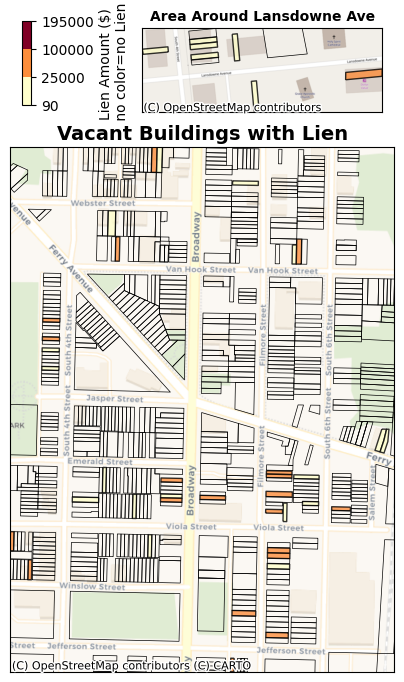

In [ ]:
#mapping Lien Amounts only for vacant buildings

vacant_main = wf_south[wf_south['Status'] == 'Vacant Building']
vacant_lansdowne = lansdowne_area[lansdowne_area['Status'] == 'Vacant Building']


bounds = [90, 25000, 100000, 195000] #bins based on Mike's preferences
vmin = min(vacant_main['LienAmount'].min(), vacant_lansdowne['LienAmount'].min())
vmax = max(vacant_main['LienAmount'].max(), vacant_lansdowne['LienAmount'].max())
cmap = plt.cm.YlOrRd
norm = colors.BoundaryNorm(boundaries=bounds, ncolors=cmap.N, clip=True)

# Create figure and main axis
fig = plt.figure(figsize=(6, 7))
main_ax = fig.add_axes([0.1, 0.1, 0.8, 0.75])

# Plot main area with shared color map and basemap from openstreetmap
vacant_main.plot(ax=main_ax, alpha=0.8, edgecolor='black',
              column='LienAmount', cmap=cmap, norm=norm)
ctx.add_basemap(main_ax, source=ctx.providers.CartoDB.Voyager)
main_ax.set_xlim(*vacant_main.total_bounds[[0, 2]])
main_ax.set_ylim(*vacant_main.total_bounds[[1, 3]])
main_ax.set_title("Vacant Buildings with Lien", fontsize=14, fontweight='bold')

missing = wf_south[wf_south['LienAmount'].isna()]
missing.boundary.plot(ax=main_ax, color='black', linewidth=0.5)

# Create inset axis above the main map for area around lansdowne
inset_ax = fig.add_axes([0.4, 0.9, 0.4, 0.12])


vacant_lansdowne.plot(ax=inset_ax, alpha=0.8, edgecolor='black',
                    column='LienAmount', cmap=cmap, norm=norm)
ctx.add_basemap(inset_ax, source=ctx.providers.OpenStreetMap.Mapnik)
inset_ax.set_xlim(*vacant_lansdowne.total_bounds[[0, 2]])
inset_ax.set_ylim(*vacant_lansdowne.total_bounds[[1, 3]])
inset_ax.set_xticks([])
inset_ax.set_yticks([])
inset_ax.set_title("Area Around Lansdowne Ave", fontsize=10, fontweight='bold')

missing2 = lansdowne_area[lansdowne_area['LienAmount'].isna()]
missing2.boundary.plot(ax=inset_ax, color='black', linewidth=0.5)


sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm._A = []


cbar_ax = fig.add_axes([0.2, 0.91, 0.015, 0.12])
cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.set_label('Lien Amount ($)\n no color=no Lien', fontsize=10)

main_ax.set_xticks([]) #kills xticks
main_ax.set_yticks([]) #kills xticks

plt.show()

###Building status map

/usr/local/lib/python3.11/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<Axes: >

(-8362663.577103756, -8361945.641501923)

(4854081.441443107, 4855074.278317256)

Text(0.5, 1.0, 'Waterfront South – Property Status')

/usr/local/lib/python3.11/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<Axes: >

(-8362544.070359673, -8362283.603444299)

(4855426.219170547, 4855524.066587218)

[]

[]

Text(0.5, 1.0, 'Area Around Lansdowne Ave')

(np.float64(0.0), np.float64(1.0), np.float64(0.0), np.float64(1.0))

[]

[]

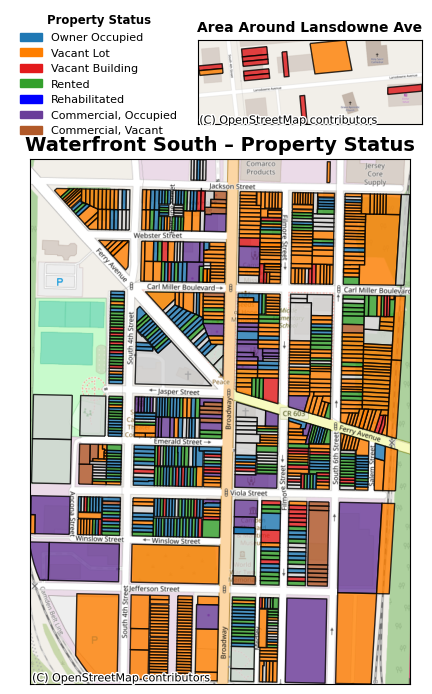

In [ ]:
import matplotlib.patches as mpatches
#code for categorical color codes adapted from chatGPT
# Define category list and assign a color to each
status_categories = ['Owner Occupied', 'Vacant Lot', 'Vacant Building',
    'Rented', 'Rehabilitated', 'Commercial, Occupied', 'Commercial, Vacant']

category_colors = [
    '#1f78b4',  # Blue
    '#ff7f00',  # Orange
    '#e31a1c',  # Red
    '#33a02c',  # Green
    '#0000FF',  #Blue
    '#6a3d9a',  # Purple
    '#b15928'   # Brown
]

status_cmap = dict(zip(status_categories, category_colors))

def map_status_color(status):
    return status_cmap.get(status, '#d3d3d3')  # light gray for missing/unknown

fig = plt.figure(figsize=(6, 7))
main_ax = fig.add_axes([0.1, 0.1, 0.8, 0.75])

wf_south['color'] = wf_south['Status'].map(map_status_color)
wf_south.plot(ax=main_ax, color=wf_south['color'], edgecolor='black', alpha=0.8)
ctx.add_basemap(main_ax, source=ctx.providers.OpenStreetMap.Mapnik)
main_ax.set_xlim(*wf_south.total_bounds[[0, 2]])
main_ax.set_ylim(*wf_south.total_bounds[[1, 3]])
main_ax.set_title("Waterfront South – Property Status", fontsize=14, fontweight='bold')

inset_ax = fig.add_axes([0.45, 0.9, 0.4, 0.12])
lansdowne_area['color'] = lansdowne_area['Status'].map(map_status_color)
lansdowne_area.plot(ax=inset_ax, color=lansdowne_area['color'], edgecolor='black', alpha=0.8)
ctx.add_basemap(inset_ax, source=ctx.providers.OpenStreetMap.Mapnik)
inset_ax.set_xlim(*lansdowne_area.total_bounds[[0, 2]])
inset_ax.set_ylim(*lansdowne_area.total_bounds[[1, 3]])
inset_ax.set_xticks([])
inset_ax.set_yticks([])
inset_ax.set_title("Area Around Lansdowne Ave", fontsize=10, fontweight='bold')

#add legend
legend_patches = [mpatches.Patch(color=color, label=label)
                  for label, color in status_cmap.items()]

legend_ax = fig.add_axes([0.15, 0.92, 0.3, 0.1])  # Adjust position as needed
legend_ax.axis('off')
legend = legend_ax.legend(
    handles=legend_patches,
    loc='center left',
    frameon=False,
    title='Property Status',
    fontsize=8,
    title_fontsize='small'
)
legend.get_title().set_fontweight('bold')

main_ax.set_xticks([])
main_ax.set_yticks([])

plt.show()

###Vacant parcels map

/usr/local/lib/python3.11/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<Axes: >

(-8362663.577103756, -8361945.641501923)

(4854081.441443107, 4855074.278317256)

Text(0.5, 1.0, 'Waterfront South – Vacant Parcels')

/usr/local/lib/python3.11/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


<Axes: >

(-8362544.070359673, -8362283.603444299)

(4855426.219170547, 4855524.066587218)

[]

[]

Text(0.5, 1.0, 'Area Around Lansdowne Ave')

(np.float64(0.0), np.float64(1.0), np.float64(0.0), np.float64(1.0))

[]

[]

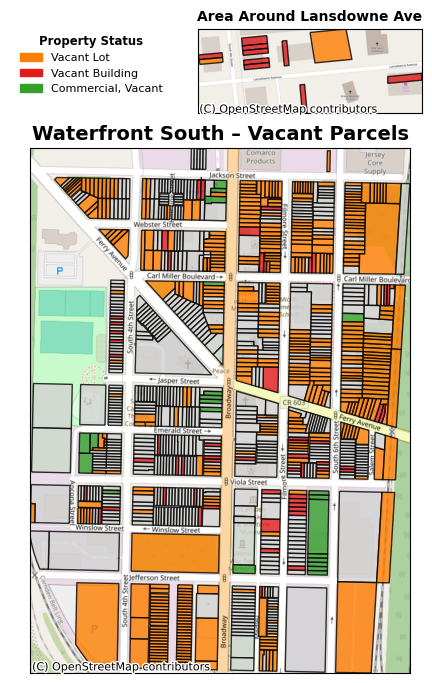

In [ ]:

status_categories = ['Vacant Lot', 'Vacant Building',
    'Commercial, Vacant']

category_colors = [
    '#ff7f00',  # Orange
    '#e31a1c',  # Red
    '#33a02c',  # Green
]

status_cmap = dict(zip(status_categories, category_colors))

def map_status_color(status):
    return status_cmap.get(status, '#d3d3d3')  # light gray for missing/unknown

fig = plt.figure(figsize=(6, 7))
main_ax = fig.add_axes([0.1, 0.1, 0.8, 0.75])

wf_south['color'] = wf_south['Status'].map(map_status_color)
wf_south.plot(ax=main_ax, color=wf_south['color'], edgecolor='black', alpha=0.8)
ctx.add_basemap(main_ax, source=ctx.providers.OpenStreetMap.Mapnik)
main_ax.set_xlim(*wf_south.total_bounds[[0, 2]])
main_ax.set_ylim(*wf_south.total_bounds[[1, 3]])
main_ax.set_title("Waterfront South – Vacant Parcels", fontsize=14, fontweight='bold')

inset_ax = fig.add_axes([0.45, 0.9, 0.4, 0.12])
lansdowne_area['color'] = lansdowne_area['Status'].map(map_status_color)
lansdowne_area.plot(ax=inset_ax, color=lansdowne_area['color'], edgecolor='black', alpha=0.8)
ctx.add_basemap(inset_ax, source=ctx.providers.OpenStreetMap.Mapnik)
inset_ax.set_xlim(*lansdowne_area.total_bounds[[0, 2]])
inset_ax.set_ylim(*lansdowne_area.total_bounds[[1, 3]])
inset_ax.set_xticks([])
inset_ax.set_yticks([])
inset_ax.set_title("Area Around Lansdowne Ave", fontsize=10, fontweight='bold')

# Add legend
legend_patches = [mpatches.Patch(color=color, label=label)
                  for label, color in status_cmap.items()]

legend_ax = fig.add_axes([0.15, 0.92, 0.3, 0.1])  # Adjust position as needed
legend_ax.axis('off')
legend = legend_ax.legend(
    handles=legend_patches,
    loc='center left',
    frameon=False,
    title='Property Status',
    fontsize=8,
    title_fontsize='small'
)
legend.get_title().set_fontweight('bold')

main_ax.set_xticks([])
main_ax.set_yticks([])

plt.show()

###Owner Categories

###Status Change in Past Year

In [ ]:
#add in data from 2024
dataHOC24=pd.read_excel('https://docs.google.com/uc?id=17twWN--deTjKyMMvnEjfXelvO6kBjaUO&export=download', 'All Parcels (2024)')

In [ ]:
dataHOC24.head(5)

,Status,name,Block,Lot,Owner,Owneraddress,OwnerAddressSameasLocation,LienAmount,LienHolder,InfoverifiedbyCityOPRA,Size,AcquisitionType,AcquisitionStatus,Notes,LastSaleDate,PropertyClass,Other,FloodZone,HistoricDistrict,Zoning
0,Vacant Lot,1441 S 4th St,279.0,8.0,"PADIN-MONTALVO, MARIELYS","1439 SO 4TH STREET, CAMDEN, NJ 08104",no,-,NaN,no,NaN,NaN,NaN,NaN,NaN,15C-Public Property,NaN,NaN,NaN,NaN
1,Vacant Building,1443 S 4th St,279.0,81.0,BERGEN SQ COMMUNITY DEV COALITION,"PO BOX 445, CAMDEN, NJ 08101",no,21000,"CSA Homes LLC, Lillian Zhang",no,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Vacant Lot,1445 S 4th St,279.0,82.0,"SMITH, PEARL","1445 S 4th St CAMDEN, NJ 08104-1338",yes,52693.79,City of Camden,no,NaN,NaN,NaN,NaN,1997,NaN,856-963-7338? Maybe,NaN,NaN,NaN
3,Vacant Lot,434 Lansdowne,342.0,89.0,FIRST CHURCH OF DELIVERANCE,"PO BOX 1419, CAMDEN, NJ 08105",no,-,NaN,no,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Vacant Building,1436 S 4th St,342.0,107.0,"KANELSKY, CHANA","1436 SO 4TH STREET, CAMDEN, NJ 08104",yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#merge data from 2024 and 2025 on block and lot
#code for suffixes from https://stackoverflow.com/questions/34338374/pandas-control-new-column-names-when-merging-two-dataframes
change = pd.merge(dataHOC, dataHOC24, on=['Block', 'Lot'],how='outer',indicator='merge', suffixes=('_2025', '_2024'))
change[['Block','Lot','merge']]

change2 = pd.merge(dataHOC, dataHOC24, on=['Block', 'Lot'],how='inner',indicator=False, suffixes=('_2025', '_2024'))

,Block,Lot,merge
0,279.0,8.0,both
1,279.0,81.0,both
2,279.0,82.0,both
3,342.0,89.0,both
4,342.0,107.0,both
...,...,...,...
1066,501.0,50.0,left_only
1067,502.0,39.0,both
1068,503.0,1.0,both
1069,NaN,NaN,both


In [ ]:
print(change['merge'].value_counts())

merge
both          1032
left_only       38
right_only       1
Name: count, dtype: int64


In [ ]:
change2

,Status_2025,name_2025,Block,Lot,Owner_2025,Owneraddress_2025,OwnerAddressSameasLocation_2025,LienAmount_2025,LienHolder_2025,InfoverifiedbyCityOPRA_2025,...,Size_2024,AcquisitionType_2024,AcquisitionStatus_2024,Notes_2024,LastSaleDate_2024,PropertyClass_2024,Other_2024,FloodZone_2024,HistoricDistrict_2024,Zoning_2024
0,Vacant Lot,1441 S 4th St,279.0,8.0,"PADIN-MONTALVO, MARIELYS","1439 SO 4TH STREET, CAMDEN, NJ 08104",no,-,NaN,no,...,NaN,NaN,NaN,NaN,NaN,15C-Public Property,NaN,NaN,NaN,NaN
1,Vacant Building,1443 S 4th St,279.0,81.0,BERGEN SQ COMMUNITY DEV COALITION,"PO BOX 445, CAMDEN, NJ 08101",no,21000,"CSA Homes LLC, Lillian Zhang",no,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Vacant Lot,1445 S 4th St,279.0,82.0,"SMITH, PEARL","1445 S 4th St CAMDEN, NJ 08104-1338",yes,52693.79,City of Camden,no,...,NaN,NaN,NaN,NaN,1997,NaN,856-963-7338? Maybe,NaN,NaN,NaN
3,Vacant Lot,434 Lansdowne,342.0,89.0,FIRST CHURCH OF DELIVERANCE,"PO BOX 1419, CAMDEN, NJ 08105",no,-,NaN,no,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Vacant Building,1436 S 4th St,342.0,107.0,"KANELSKY, CHANA","1436 SO 4TH STREET, CAMDEN, NJ 08104",yes,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1027,"Commercial, Occupied",2001 SO 6TH ST,502.0,39.0,"2001 SOUTH SIX, LLC","1930 6TH STREET, CAMDEN, NJ 08104",no,NaN,NaN,NaN,...,NaN,NaN,NaN,"09/13/2023 $1,572,500, $703,700\n01/23/2015 $2...",9/13/2023,4B-Industrial,NaN,NaN,NaN,NaN
1028,Vacant Lot,SE 6TH & JEFFERSON STS,503.0,1.0,"LIEZE PROPERTIES, LLC","1930 SO 6TH STREET, CAMDEN, NJ 08104",no,NaN,NaN,NaN,...,NaN,NaN,NaN,"08/14/2018 $585,000, $129,900\n09/06/1984 $350...",8/14/2018,4A-Commercial,NaN,NaN,NaN,NaN
1029,Vacant Building,457 Lansdowne Ave,NaN,NaN,FIRST CHURCH OF DELIVERANCE,"PO BOX 1419, CAMDEN, NJ 08105",NaN,NaN,NaN,no,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#creating new dataframe with only those parcels for which the status has changed between 2024 and 2025
change3 = change2[(change2['Status_2025'].notna()) & (change2['Status_2024'].notna()) & (change2['Status_2025'] != change2['Status_2024'])]

In [ ]:
change3

,Status_2025,name_2025,Block,Lot,Owner_2025,Owneraddress_2025,OwnerAddressSameasLocation_2025,LienAmount_2025,LienHolder_2025,InfoverifiedbyCityOPRA_2025,...,Size_2024,AcquisitionType_2024,AcquisitionStatus_2024,Notes_2024,LastSaleDate_2024,PropertyClass_2024,Other_2024,FloodZone_2024,HistoricDistrict_2024,Zoning_2024
30,Under Construction,346 Jackson St,462.00,25.0,"WIZZART, RODERICK","1137 KENWOOD AVENUE, CAMDEN, NJ 08103",no,20060.49,JAMES MCNAIR,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
76,Owner Occupied,425 WEBSTER ST,464.00,91.0,"VU, TRAVIS THU","425 WEBSTER STREET, CAMDEN, NJ 08104",no,NaN,NaN,NaN,...,NaN,NaN,NaN,"04/21/2004 $1, $16,300\n07/10/2003 $20,000, $1...",04/21/2004,2-Residential,NaN,NaN,NaN,NaN
80,Vacant Lot,1607 Broadway,464.00,103.0,"MCCARGO, LEON","1235 BROWNING STREET, Camden NJ 08104",no,1422,"City of Camden & SOUTHWEST ASSET MANAGEMENT, LLC",yes,...,NaN,NaN,NaN,NaN,NaN,NaN,2014,NaN,NaN,NaN
153,Vacant Lot,1611 Filmore St,468.00,32.0,"CCTS CAMDEN OPPORTUNITY FUND, LLC","2500 MCCLELLAN AVE, #200 oennsauken NJ 08109",no,25000,WATERFRONT SOUTH COMMUNITY PAR,no,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
211,Vacant Building,565 Carl Miller Blvd,469.00,86.0,"STREATER, NIGEL","NORTHGATE I APTS, APT 145 CAMDEN, NJ 08102",no,29003.83,City of Camden,no,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.2% Annual Flood Chance Hazard,NaN,NaN
235,Rented,1611 SO 6TH ST,469.00,124.0,"POPE, LANCE","48 STUDIO LANE, STATEN ISLAND, NY 10304\t",no,NaN,NaN,NaN,...,NaN,NaN,NaN,"04/30/2018 $17,000, $48,300\n09/23/2016 $1, $4...",4/30/2018,2-Residential,NaN,NaN,NaN,NaN
280,Rented,1715 S 4th St,472.00,8.0,"RVP QOZ BUSINESS, LLC","216 HADDON AVENUE, HADDON TOWNSHIP, NJ 08108",no,NaN,NaN,yes,...,Lien Assignment request from city,NaN,Amy Gialuco's properties,NaN,NaN,NaN,NaN,NaN,NaN,NaN
282,Rented,1719 S 4th St,472.00,10.0,"RVP QOZ BUSINESS, LLC","216 HADDON AVENUE, HADDON TOWNSHIP, NJ 08108",no,NaN,NaN,no,...,Lien Assignment request from city,NaN,Amy Gialuco's properties,NaN,NaN,NaN,NaN,NaN,NaN,NaN
288,Rented,1731 SO 4TH ST,472.00,16.0,"LIGHT WORK PROPERTIES, LLC","PO BOX 68, FLOURTOWN, PA 19031",no,NaN,NaN,NaN,...,NaN,NaN,NaN,"05/15/2023 $1, $33,800\n10/04/2007 $1, $10,800...",5/15/2023,2-Residential,NaN,NaN,NaN,NaN
290,Rented,1735 S 4th St,472.00,18.0,"RVP QOZ BUSINESS, LLC","216 HADDON AVENUE, HADDON TOWNSHIP, NJ 08108",no,NaN,NaN,no,...,Lien Assignment request from city,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#merging data with geodataframe
change4 = pd.merge(change3, cam_par2, on=['Block', 'Lot'],how='inner',indicator=False)

In [ ]:
type(change4)

pandas.core.frame.DataFrame

In [ ]:
change5 = gpd.GeoDataFrame(change4)

In [ ]:
len(change4)

44

In [ ]:
#splitting area around lansdown off in change dataframe
lansdowne_address = ["1443 S 4th St", "1445 S 4th St","1436 S 4th St", "1438 S 4th St", "1440 S 4th St", "1444 S 4th St", "1446 S 4th St", "417 Lansdowne Ave", "434 Lansdowne ", "422 Lansdowne Ave", "1451 Broadway Ave"]
lansdowne_change = change5[change5['name_2025'].isin(lansdowne_address)].copy()
wf_south_change = change5[~change5['name_2025'].isin(lansdowne_address)].copy()

Text(0.5, 0.98, 'Change in Status between 2024 and 2025')

<Axes: >

/tmp/ipython-input-1307017393.py:42: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  lansdowne_change_2.plot(ax=axes[0], color=lansdowne_change_2['color_2024'], alpha=0.8, edgecolor='black')


<Axes: >

(-8362662.326558047, -8361983.317342009)

(4854082.919953371, 4855016.494502677)

Text(0.5, 1.0, 'Property Status – 2024')

[]

[]

<Axes: >

/tmp/ipython-input-1307017393.py:58: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  lansdowne_change_2.plot(ax=axes[1], color=lansdowne_change_2['color_2025'], alpha=0.8, edgecolor='black')


<Axes: >

(-8362662.326558047, -8361983.317342009)

(4854082.919953371, 4855016.494502677)

Text(0.5, 1.0, 'Property Status – 2025')

[]

[]

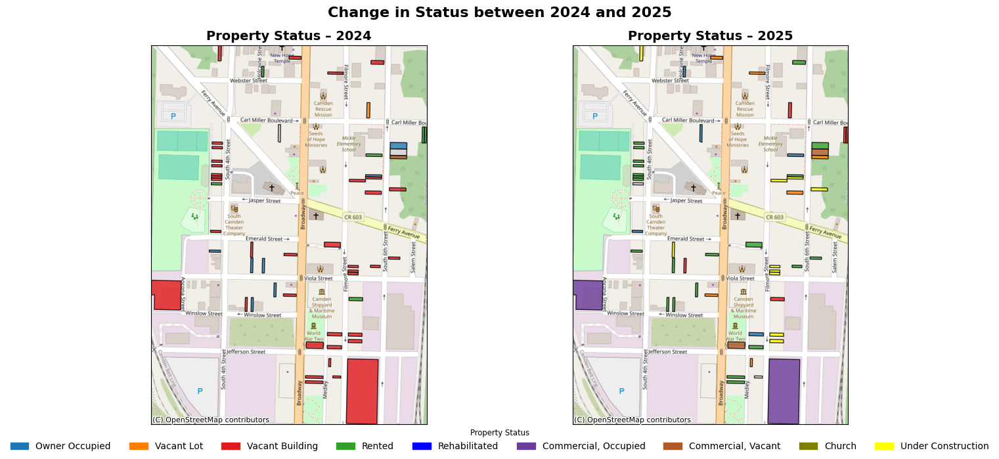

In [ ]:
import matplotlib.patches as mpatches
import contextily as ctx
#code for categorical color codes adapted from chatGPT
# Define category list and assign a color to each
status_categories = ['Owner Occupied', 'Vacant Lot', 'Vacant Building',
    'Rented', 'Rehabilitated', 'Commercial, Occupied', 'Commercial, Vacant', 'Church', 'Under Construction']

category_colors = [
    '#1f78b4',  # Blue
    '#ff7f00',  # Orange
    '#e31a1c',  # Red
    '#33a02c',  # Green
    '#0000FF',  #Blue
    '#6a3d9a',  # Purple
    '#b15928',   # Brown
    '#808000', #Olive
    '#ffff00' #Yellow
]

status_cmap_full = dict(zip(status_categories, category_colors))

def map_status_color_full(status):
    return status_cmap_full.get(status, '#d3d3d3')  # light gray for missing/unknown


#mapping status 2024 and status 2025 next to each other only showing those parcels where status has changed

fig, axes = plt.subplots(1, 2, figsize=(14, 7))  # two maps side by side
fig.suptitle("Change in Status between 2024 and 2025", fontsize=16, fontweight='bold')

# Reproject data to EPSG:3857 before plotting
wf_south_change_2 = wf_south_change.to_crs(epsg=3857)
lansdowne_change_2 = lansdowne_change.to_crs(epsg=3857)

# --- First Map: Status 2024 ---
wf_south_change_2['color_2024'] = wf_south_change_2['Status_2024'].map(map_status_color_full)
lansdowne_change_2['color_2024'] = lansdowne_change_2['Status_2024'].map(map_status_color_full)

# Plot Waterfront South
wf_south_change_2.plot(ax=axes[0], color=wf_south_change_2['color_2024'], alpha=0.8, edgecolor='black')
# Add Lansdowne Area as inset inside the same map
lansdowne_change_2.plot(ax=axes[0], color=lansdowne_change_2['color_2024'], alpha=0.8, edgecolor='black')

ctx.add_basemap(axes[0], source=ctx.providers.OpenStreetMap.Mapnik)
axes[0].set_xlim(*wf_south_change_2.total_bounds[[0, 2]])
axes[0].set_ylim(*wf_south_change_2.total_bounds[[1, 3]])
axes[0].set_title("Property Status – 2024", fontsize=14, fontweight='bold')
axes[0].set_xticks([])
axes[0].set_yticks([])

# --- Second Map: Status 2025 ---
wf_south_change_2['color_2025'] = wf_south_change_2['Status_2025'].map(map_status_color_full)
lansdowne_change_2['color_2025'] = lansdowne_change_2['Status_2025'].map(map_status_color_full)

# Plot Waterfront South
wf_south_change_2.plot(ax=axes[1], color=wf_south_change_2['color_2025'], alpha=0.8, edgecolor='black')
# Add Lansdowne Area
lansdowne_change_2.plot(ax=axes[1], color=lansdowne_change_2['color_2025'], alpha=0.8, edgecolor='black')

ctx.add_basemap(axes[1], source=ctx.providers.OpenStreetMap.Mapnik)
axes[1].set_xlim(*wf_south_change_2.total_bounds[[0, 2]])
axes[1].set_ylim(*wf_south_change_2.total_bounds[[1, 3]])
axes[1].set_title("Property Status – 2025", fontsize=14, fontweight='bold')
axes[1].set_xticks([])
axes[1].set_yticks([])

# --- Shared Legend ---
legend_patches = [mpatches.Patch(color=color, label=label)
                  for label, color in status_cmap_full.items()]

fig.legend(
    handles=legend_patches,
    loc='lower center',
    ncol=len(status_cmap_full),
    frameon=False,
    title='Property Status',
    fontsize=10,
    title_fontsize='small'
)

plt.tight_layout(rect=[0, 0.05, 1, 1])  # space for legend
plt.show()

#Redefining Blocks

In [ ]:
#importing a new dataset that redefines blocks based on how blocks are perceived (who lives 'on my block' vs how tax map defines blocks)
new_blocks=pd.read_excel('https://docs.google.com/uc?id=1X9TluqwIjC_sfFykjDk61jgfJsN7ItEz&export=download')

In [ ]:
new_blocks.head(5)

,Perceived Block Number,Block,Lot
0,1,466.0,4
1,1,466.0,3
2,1,466.0,2
3,1,466.0,73
4,1,466.0,57


In [ ]:
new_blocks.dtypes

,0
Perceived Block Number,int64
Block,float64
Lot,int64


In [ ]:
new_blocks['Lot '] = pd.to_numeric(new_blocks['Lot '], errors='coerce')

In [ ]:
new_blocks = new_blocks.rename(columns={'Lot ': 'Lot', 'Block ': 'Block'})

In [ ]:
HOCmap2.dtypes

,0
Status,object
name,object
Block,float64
Lot,float64
Owner,object
Owneraddress,object
OwnerAddressSameasLocation,object
LienAmount,float64
LienHolder,object
InfoverifiedbyCityOPRA,object


In [ ]:
new_blocks_map = pd.merge(HOCmap2, new_blocks, on=['Block', 'Lot'],how='outer',indicator='merge')
new_blocks_map[['Block','Lot','merge', 'Status', 'Perceived Block Number']]

HOCmap3 = pd.merge(HOCmap2, new_blocks, on=['Block', 'Lot'],how='inner',indicator=False)

,Block,Lot,merge,Status,Perceived Block Number
0,279.0,81.0,left_only,Vacant Building,NaN
1,279.0,82.0,left_only,Vacant Lot,NaN
2,342.0,89.0,left_only,Vacant Lot,NaN
3,342.0,107.0,left_only,Vacant Building,NaN
4,342.0,108.0,left_only,Vacant Building,NaN
...,...,...,...,...,...
1056,501.0,50.0,both,NaN,34.0
1057,501.0,50.0,both,NaN,34.0
1058,502.0,39.0,left_only,"Commercial, Occupied",NaN
1059,503.0,1.0,left_only,Vacant Lot,NaN


In [ ]:
type(HOCmap3)

geopandas.geodataframe.GeoDataFrame

<Axes: >

/tmp/ipython-input-1675062720.py:7: UserWarning: The GeoSeries you are attempting to plot is empty. Nothing has been displayed.
  missing.boundary.plot(ax=ax, color='black', linewidth=0.5)


<Axes: >

[]

[]

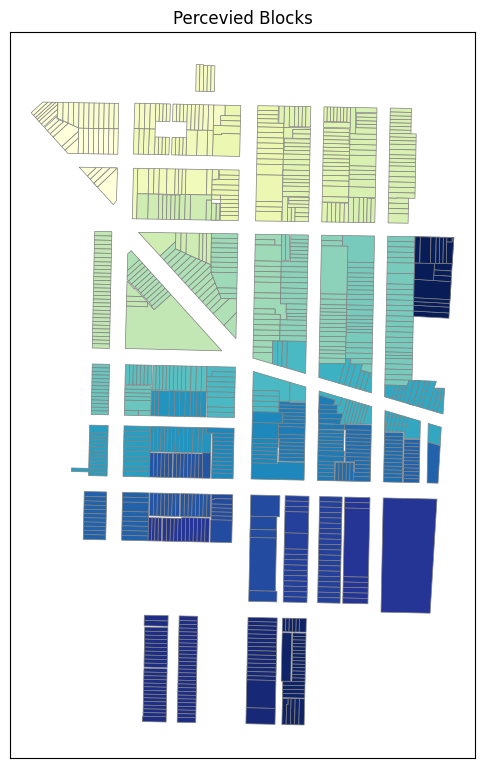

In [ ]:
#mapping percevied blocks to see if assigning each parcel a number worked and to see what parcels did not merge
fig, ax = plt.subplots(1, figsize=(6,10))
HOCmap3.plot(ax=ax,column='Perceived Block Number',cmap='YlGnBu',
          scheme="natural_breaks", k=32, edgecolor='grey',linewidth=0.5)

missing = HOCmap3[HOCmap3['Perceived Block Number'].isna()]
missing.boundary.plot(ax=ax, color='black', linewidth=0.5)

ax.title.set_text("Percevied Blocks")
ax.set_xticks([]) #kills xticks
ax.set_yticks([]) #kills xticks

In [ ]:
#create shapefile with just outlines of percevied blocks
#code adapted from https://geopandas.org/en/stable/docs/user_guide/aggregation_with_dissolve.html
per_block = HOCmap3.dissolve(by='Perceived Block Number')


In [ ]:
type(per_block)

geopandas.geodataframe.GeoDataFrame

<Axes: >

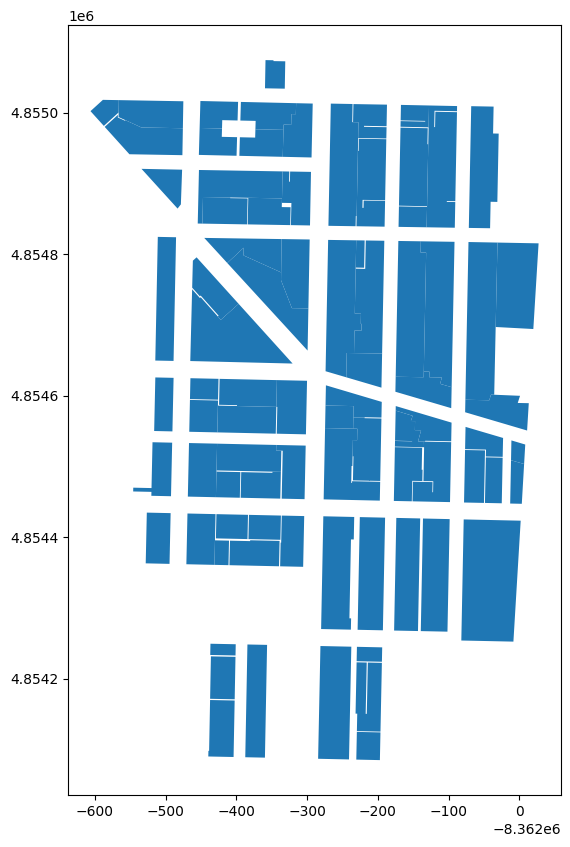

In [ ]:
per_block.plot(figsize=(10,10))

###Vacancy Ratio (General)

In [ ]:
#defining which categories in 'Status' count as vacant
vacant_categories = ['Vacant Lot', 'Vacant Building', 'Commercial, Vacant']

#creating ne column labeled vacancy which is vacant if status falls into categories defined above and non-vacant if it doesn't
HOCmap3['vacancy'] = HOCmap3['Status'].apply(lambda x: 'vacant' if x in vacant_categories else 'non_vacant')

#creating new dataframe that is grouped by perceived block and counts how many vacant and non-vacant parcels each block has
#code adapted from chatGPT
vacancy_counts = HOCmap3.groupby(['Perceived Block Number', 'vacancy']).size().unstack(fill_value=0)

#creating new column that calculates vacancy ratio per block (#of vacant parcels/#of all parcels)
vacancy_counts['vacant_ratio'] = vacancy_counts['vacant'] / (vacancy_counts['vacant'] + vacancy_counts['non_vacant'])


In [ ]:
vacancy_counts.head(5)

vacancy,non_vacant,vacant,vacant_ratio
Perceived Block Number,,,
1,9,17,0.653846
2,3,9,0.750000
3,20,4,0.166667
4,16,10,0.384615
5,5,30,0.857143


In [ ]:
# Reset the index of per_block so 'Perceived Block Number' becomes a column again
per_block_reset = per_block.reset_index()

#merge using the reset dataframe
per_vacancy = pd.merge(per_block_reset, vacancy_counts, on='Perceived Block Number',how='outer',indicator=True)
per_vacancy[['Perceived Block Number','vacant_ratio','_merge']]

per_vac_map = pd.merge(vacancy_counts, per_block_reset, on=['Perceived Block Number'],how='inner',indicator=False)

,Perceived Block Number,vacant_ratio,_merge
0,1,0.653846,both
1,2,0.750000,both
2,3,0.166667,both
3,4,0.384615,both
4,5,0.857143,both
5,6,0.846154,both
6,7,0.673469,both
7,8,0.545455,both
8,9,0.205882,both
9,10,0.000000,both


In [ ]:
type(per_vac_map)

pandas.core.frame.DataFrame

In [ ]:
per_vac_map2 = gpd.GeoDataFrame(per_vac_map, geometry='geometry')

In [ ]:
per_vac_map2.head(5)

,Perceived Block Number,non_vacant,vacant,vacant_ratio,geometry,Status,name,Block,Lot,Owner,...,LastSaleDate,PropertyClass,Other,FloodZone,HistoricDistrict,Zoning,PAMS_PIN,MUN,QCODE,LASTUPDATE
0,1,9,17,0.653846,"MULTIPOLYGON (((-8362577.581 4854970.501, -836...",Vacant Lot,1624 Ferry,462.0,3.0,CCMUA,...,1991,15C-Public Property,Person w/ same name died 2006,None,None,None,0408_462_3,0408,None,NaT
1,2,3,9,0.750000,"POLYGON ((-8362535.004 4854979.439, -8362542.8...",Vacant Lot,SS JACKSON 209 W 4TH ST,462.0,16.0,"JENKINS, WILLIAM R",...,,2-Residential,856-270-2749 Works at CHOP. Married to Ebony M...,None,None,None,0408_462_16,0408,None,NaT
2,3,20,4,0.166667,"MULTIPOLYGON (((-8362428.624 4854977.836, -836...",Owner Occupied,437 JACKSON ST,458.0,5.0,"REAL PORTFOLIO 6, LLC",...,08/10/2011,2-Residential,demolished 2020,None,None,None,0408_458_5,0408,None,NaT
3,4,16,10,0.384615,"MULTIPOLYGON (((-8362452.858 4854918.985, -836...",Vacant Lot,421 WEBSTER ST,463.0,43.0,City of Camden,...,Vacant Lot,2-Residential,609-338-1655/856-342-7662 --May live at 441 Er...,None,None,None,0408_463_43,0408,None,NaT
4,5,5,30,0.857143,"MULTIPOLYGON (((-8362322.192 4854872.303, -836...","Commercial, Vacant",1601-1603 Broadway,464.0,71.0,"SOUTHWEST ASSET MANAGEMENT, LLC",...,09/06/2023,2-Residential,2014,0.2% Annual Flood Chance Hazard,None,None,0408_464_71,0408,None,NaT


<Axes: >

Text(0.5, 1.0, 'Vacancy Ratio by Perceived Block')

[]

[]

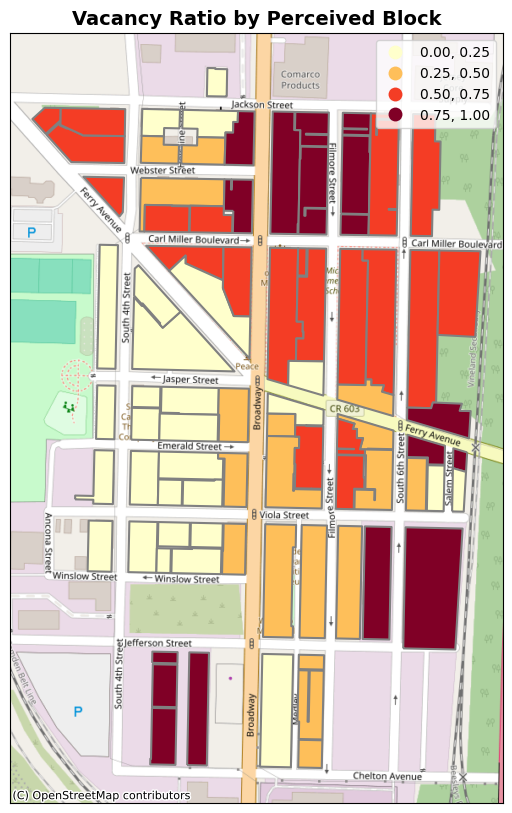

In [ ]:
import matplotlib.pyplot as plt
import contextily as ctx


# make sure CRS is correct
per_vac_map2 = per_vac_map2.set_crs(HOCmap3.crs)
per_vac_map2 = per_vac_map2.to_crs(epsg=3857)


fig, ax = plt.subplots(1, figsize=(10, 10))
per_vac_map2.plot(ax=ax, column='vacant_ratio', cmap='YlOrRd', legend=True, scheme="user_defined", classification_kwds={'bins':[0.25, 0.5, 0.75]}, k=4, edgecolor='grey',linewidth=1.5)

# Add the basemap from openstreetmap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title("Vacancy Ratio by Perceived Block", fontsize=14, fontweight='bold')
ax.set_xticks([])
ax.set_yticks([])

plt.show()

###Vacant Buildings Ratio

In [ ]:
#defining which categories in 'Status' count as vacant
vacant_buildings = ['Vacant Building', 'Commercial, Vacant']

#creating ne column labeled vacanct buildings which is vacant if status falls into categories defined above and non-vacant if it doesn't
HOCmap3['vacanct building'] = HOCmap3['Status'].apply(lambda x: 'yes' if x in vacant_buildings else 'no')

#creating new dataframe that is grouped by perceived block and counts how many vacant buildings and non-vacant parcels each block has
#code adapted from chatGPT
vacanct_building_counts = HOCmap3.groupby(['Perceived Block Number', 'vacanct building']).size().unstack(fill_value=0)

#creating new column that calculates vacancy ratio per block (#of vacant parcels/#of all parcels)
vacanct_building_counts['vacant_building_ratio'] = vacanct_building_counts['yes'] / (vacanct_building_counts['yes'] + vacanct_building_counts['no'])

In [ ]:
vacanct_building_counts

vacanct building,no,yes,vacant_building_ratio
Perceived Block Number,,,
1,26,0,0.000000
2,12,0,0.000000
3,22,2,0.083333
4,25,1,0.038462
5,31,4,0.114286
6,61,4,0.061538
7,48,1,0.020408
8,21,1,0.045455
9,29,5,0.147059


In [ ]:
#merge with per_block_reset dataframe
per_build_vac = pd.merge(per_block_reset, vacanct_building_counts, on='Perceived Block Number',how='outer',indicator=True)
per_build_vac[['Perceived Block Number','vacant_building_ratio','_merge']]

per_build_map = pd.merge(per_block_reset, vacanct_building_counts, on='Perceived Block Number',how='inner',indicator=False)

,Perceived Block Number,vacant_building_ratio,_merge
0,1,0.000000,both
1,2,0.000000,both
2,3,0.083333,both
3,4,0.038462,both
4,5,0.114286,both
5,6,0.061538,both
6,7,0.020408,both
7,8,0.045455,both
8,9,0.147059,both
9,10,0.000000,both


In [ ]:
type(per_build_map)

geopandas.geodataframe.GeoDataFrame

<Axes: >

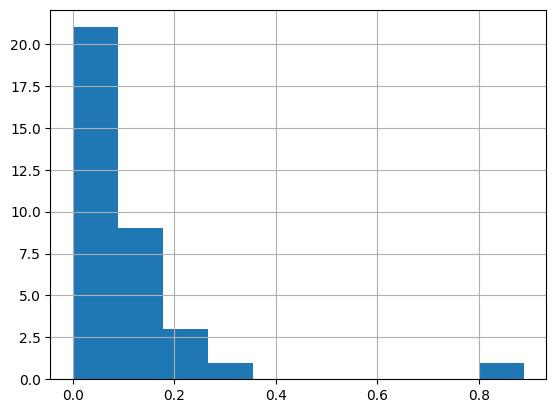

In [ ]:
per_build_map['vacant_building_ratio'].hist(bins=10)

<Axes: >

Text(0.5, 1.0, 'Vacanct Buildings Ratio by Perceived Block')

[]

[]

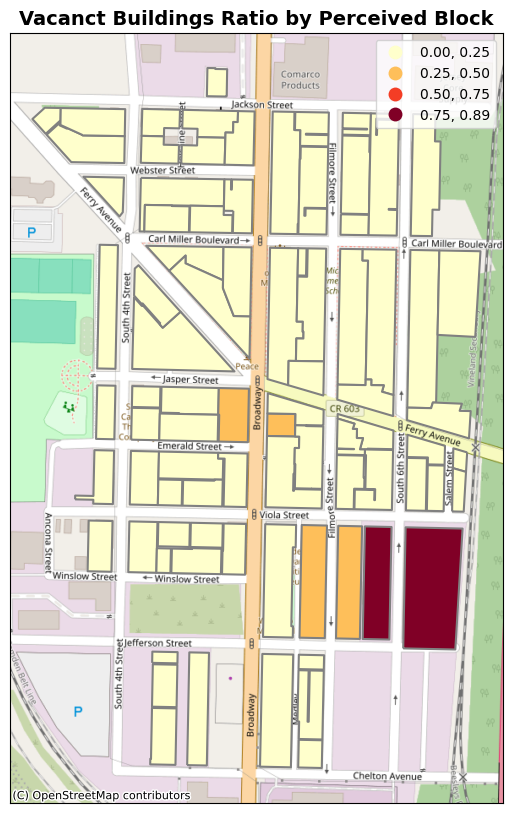

In [ ]:
# make sure CRS is correct
per_build_map = per_build_map.set_crs(HOCmap3.crs)
per_build_map = per_build_map.to_crs(epsg=3857)


fig, ax = plt.subplots(1, figsize=(10, 10))
per_build_map.plot(ax=ax, column='vacant_building_ratio', cmap='YlOrRd', legend=True, scheme="user_defined", classification_kwds={'bins':[0.25, 0.5, 0.75]}, k=4, edgecolor='grey',linewidth=1.5)

# Add the basemap from openstreetmap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title("Vacanct Buildings Ratio by Perceived Block", fontsize=14, fontweight='bold')
ax.set_xticks([]) #kills xticks
ax.set_yticks([]) #kills xticks

plt.show()

In [ ]:
HOCmap3.dtypes

,0
Status,object
name,object
Block,float64
Lot,float64
Owner,object
Owneraddress,object
OwnerAddressSameasLocation,object
LienAmount,float64
LienHolder,object
InfoverifiedbyCityOPRA,object


###Vacant Area Ratio

In [ ]:
#calculating the ratio of the actual area of all vacant categories (building, lot, commercial) compared to the total area of each perceived block

par_area = HOCmap3.to_crs(epsg=3857)
par_area["area"] = par_area.geometry.area

vacant_categories = ["Vacant Lot", "Vacant Building", "Commercial, Vacant"]
ratio_area = (par_area.groupby("Perceived Block Number").apply(lambda g: g.loc[g["Status"].isin(vacant_categories), "area"].sum() / g["area"].sum()).reset_index(name="vacant_area_ratio"))



/tmp/ipython-input-2281673160.py:7: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ratio_area = (par_area.groupby("Perceived Block Number").apply(lambda g: g.loc[g["Status"].isin(vacant_categories), "area"].sum() / g["area"].sum()).reset_index(name="vacant_area_ratio"))


In [ ]:
ratio_area.head(5)

,Perceived Block Number,vacant_area_ratio
0,1,0.700817
1,2,0.744938
2,3,0.221528
3,4,0.473632
4,5,0.688117


In [ ]:
ratio_area_map = pd.merge(ratio_area, per_block_reset, on='Perceived Block Number',how='outer',indicator=True)
ratio_area_map[['Perceived Block Number','vacant_area_ratio','_merge']]

ratio_area_map1 = pd.merge(ratio_area, per_block_reset, on='Perceived Block Number',how='inner',indicator=False)

,Perceived Block Number,vacant_area_ratio,_merge
0,1,0.700817,both
1,2,0.744938,both
2,3,0.221528,both
3,4,0.473632,both
4,5,0.688117,both
5,6,0.838686,both
6,7,0.686253,both
7,8,0.594328,both
8,9,0.080087,both
9,10,0.000000,both


In [ ]:
type(ratio_area_map1)

pandas.core.frame.DataFrame

In [ ]:
ratio_area_map2 = gpd.GeoDataFrame(ratio_area_map1)


<Axes: >

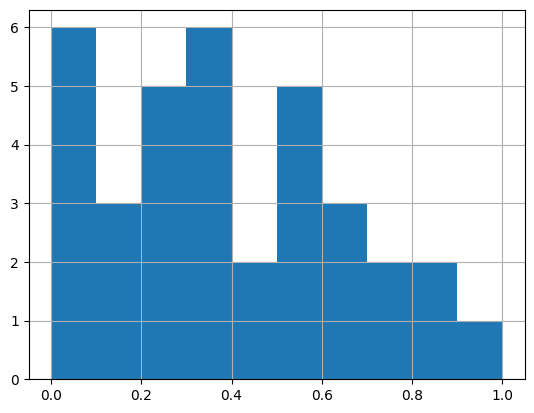

In [ ]:
ratio_area_map2['vacant_area_ratio'].hist(bins=10)

<Axes: >

Text(0.5, 1.0, 'Vacancy Ratio by Actual Area')

[]

[]

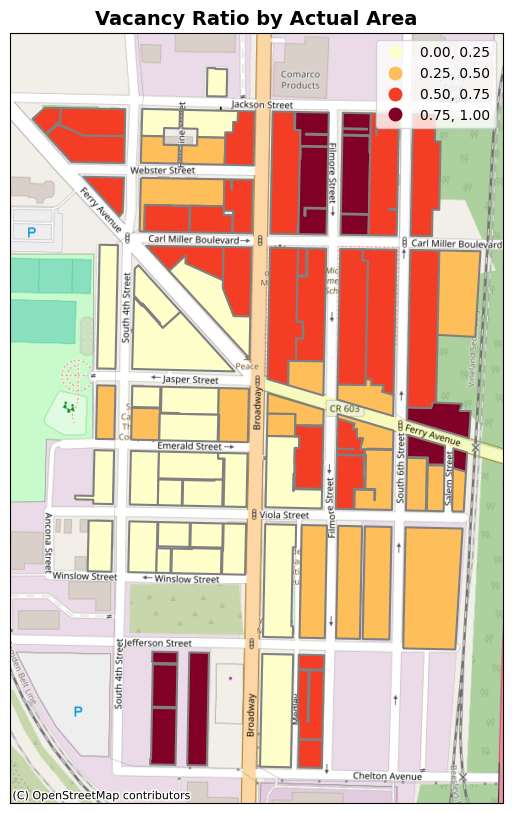

In [ ]:
#mapping vacancy ratio of actual area of all categories that are considered vacant (building, lot, and commercial)

fig, ax = plt.subplots(1, figsize=(10, 10))

ratio_area_map2.plot(ax=ax, column='vacant_area_ratio', cmap='YlOrRd', legend=True, scheme="user_defined", classification_kwds={'bins':[0.25, 0.5, 0.75]}, k=4, edgecolor='grey',linewidth=1.5)

# Add the basemap from openstreetmap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title("Vacancy Ratio by Actual Area", fontsize=14, fontweight='bold')
ax.set_xticks([])
ax.set_yticks([])

plt.show()

###Vacant Lot Residential Space Ratio (Area)

In [ ]:
residential_categories = ["Vacant Building", "Vacant Lot", "Rented", "Owner Occupied"]

vac_lot_ratio_area = (
    par_area.groupby("Perceived Block Number")
    .apply(lambda g: g.loc[g["Status"] == "Vacant Lot", "area"].sum() /
                     g.loc[g["Status"].isin(residential_categories), "area"].sum())
    .reset_index(name="vacant_lot_ratio_in_residential")
)

/tmp/ipython-input-1040910165.py:5: RuntimeWarning: invalid value encountered in scalar divide
  .apply(lambda g: g.loc[g["Status"] == "Vacant Lot", "area"].sum() /
/tmp/ipython-input-1040910165.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.loc[g["Status"] == "Vacant Lot", "area"].sum() /


In [ ]:
vac_lot_ratio_area.head(5)

,Perceived Block Number,vacant_lot_ratio_in_residential
0,1,0.797297
1,2,0.893643
2,3,0.158136
3,4,0.590104
4,5,0.893044


In [ ]:
lot_area_map = pd.merge(vac_lot_ratio_area, per_block_reset, on='Perceived Block Number',how='outer',indicator=True)
lot_area_map[['Perceived Block Number','vacant_lot_ratio_in_residential','_merge']]

lot_area_map1 = pd.merge(vac_lot_ratio_area, per_block_reset, on='Perceived Block Number',how='inner',indicator=False)

,Perceived Block Number,vacant_lot_ratio_in_residential,_merge
0,1,0.797297,both
1,2,0.893643,both
2,3,0.158136,both
3,4,0.590104,both
4,5,0.893044,both
5,6,0.802502,both
6,7,0.767359,both
7,8,0.666427,both
8,9,0.064850,both
9,10,0.000000,both


In [ ]:
type(lot_area_map1)

pandas.core.frame.DataFrame

In [ ]:
lot_area_map2 = gpd.GeoDataFrame(lot_area_map1)

<Axes: >

Text(0.5, 1.0, 'Ratio Vacant Lot/Total Residental Space per Perceived Block')

[]

[]

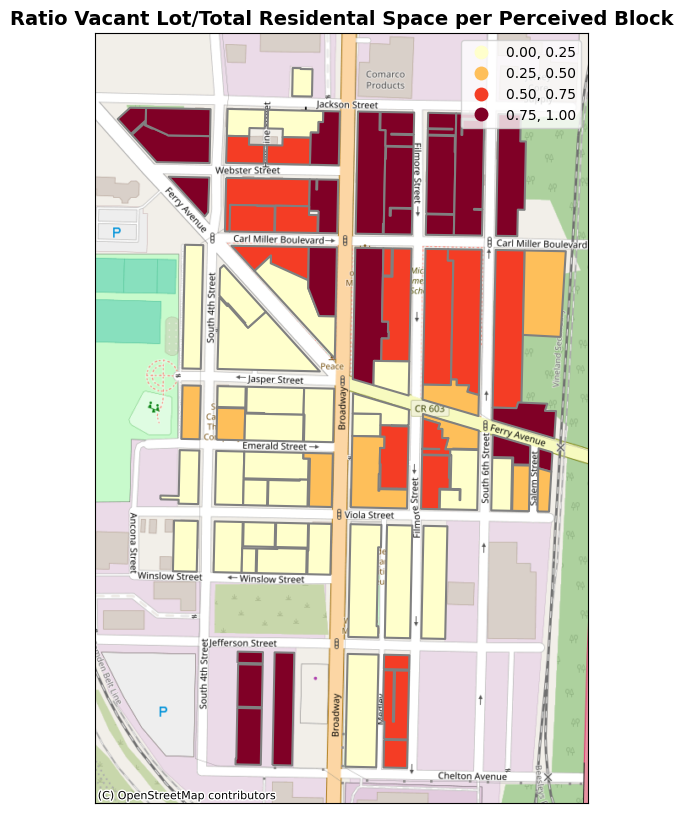

In [ ]:
fig, ax = plt.subplots(1, figsize=(10, 10))

lot_area_map2.plot(ax=ax, column='vacant_lot_ratio_in_residential', cmap='YlOrRd', legend=True, scheme="user_defined", classification_kwds={'bins':[0.25, 0.5, 0.75]}, k=4, edgecolor='grey',linewidth=1.5)

# Add the basemap from openstreetmap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_title("Ratio Vacant Lot/Total Residental Space per Perceived Block", fontsize=14, fontweight='bold')
ax.set_xticks([])
ax.set_yticks([])

plt.show()

#Interactive Maps

In [ ]:
#code adapted from AOK's folium.ipynb and ChatGPT
import folium

waterfront_south = folium.Map(location=[39.918559, -75.121833], zoom_start=16, tiles='Cartodb Voyager')

# Reset index for consistent key
HOCmap2_reset = HOCmap2.reset_index()

# Lien Amount Layer
lien_layer = folium.FeatureGroup(name="Lien Amounts")

folium.Choropleth(
    geo_data=HOCmap2_reset,
    data=HOCmap2_reset,
    columns=['index', 'LienAmount'],
    key_on='feature.properties.index',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Lien Amount',
    threshold_scale=[0, 25000, 100000, 195000]
).add_to(waterfront_south)

# Add tooltips
folium.GeoJson(
    HOCmap2_reset,
    style_function=lambda x: {'fillColor': 'transparent', 'color': 'black', 'weight': 0.5},
    highlight_function=lambda x: {
        'fillColor': 'gray', 'color': 'black', 'fillOpacity': 0.5, 'weight': 0.5
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['name', 'Owner', 'Status','LienAmount', 'LienHolder', 'Notes'],
        aliases=['Address', 'Owner', 'Status','LienAmount', 'LienHolder', 'Sales Info'],
        localize=True
    )
).add_to(lien_layer)

lien_layer.add_to(waterfront_south)

# Parcel Status Layer
status_layer = folium.FeatureGroup(name="Parcel Status")


status_colors = {
    'Vacant Lot': 'red',
    'Vacant Building': 'orange',
    'Owner Occupied': 'yellow',
    'Rented': 'blue',
    'Rehabilitated': 'lime',
    'Commercial, Occupied': 'purple',
    'Commercial, Vacant': 'pink',
    'Church': 'green'
}

HOCmap2_reset['color'] = HOCmap2_reset['Status'].map(status_colors).fillna('gray')

folium.GeoJson(
    HOCmap2_reset,
    style_function=lambda feature: {
        'fillColor': feature['properties']['color'],
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.6
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['name', 'Owner', 'Status','LienAmount', 'LienHolder', 'Notes'],
        aliases=['Address', 'Owner', 'Status','LienAmount', 'LienHolder', 'Sales Info'],
        localize=True
    )
).add_to(status_layer)

status_layer.add_to(waterfront_south)

# Vacant Buildings with Lien Layer
vacant_lien_layer = folium.FeatureGroup(name="Vacant Buildings with Lien Amount")

# Filter for vacant buildings with non-null lien amounts
vacant_buildings_with_lien = HOCmap2_reset[(HOCmap2_reset['Status'] == 'Vacant Building') & (HOCmap2_reset['LienAmount'].notnull())].copy()
vacant_buildings_with_lien = vacant_buildings_with_lien.reset_index()

folium.Choropleth(
    geo_data=vacant_buildings_with_lien,
    data=vacant_buildings_with_lien,
    columns=['index', 'LienAmount'],
    key_on='feature.properties.index',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Lien Amount for Vacant Buildings',
    threshold_scale=[0, 25000, 100000, 195000]
).add_to(waterfront_south)

folium.GeoJson(
    vacant_buildings_with_lien,
    style_function=lambda x: {'fillColor': 'transparent', 'color': 'black', 'weight': 0.5},
    highlight_function=lambda x: {
        'fillColor': 'gray', 'color': 'black', 'fillOpacity': 0.5, 'weight': 0.5
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['name', 'Owner', 'Status','LienAmount', 'LienHolder', 'Notes'],
        aliases=['Address', 'Owner', 'Status','LienAmount', 'LienHolder', 'Sales Info'],
        localize=True
    )
).add_to(vacant_lien_layer)


vacant_lien_layer.add_to(waterfront_south)


folium.LayerControl(collapsed=False).add_to(waterfront_south)

title_html = '''<h3 align="center" style="font-size:16px"><b>Lien Amounts and Property Status in Waterfront South</b></h3>'''
waterfront_south.get_root().html.add_child(folium.Element(title_html))

# Adding a legend for the status layer
legend_html = '''
     <div style="position: fixed;
                top: 50px; left: 50px; width: 150px; height: 210px;
                border:2px solid grey; z-index:9999; font-size:10px;
                ">&nbsp; <b>Property Status Legend</b> <br>
                &nbsp; <b>Vacant Lot</b> &nbsp; <i class="fa fa-square fa-2x" style="color:red"></i><br>
                &nbsp; <b>Vacant Building</b> &nbsp; <i class="fa fa-square fa-2x" style="color:orange"></i><br>
                &nbsp; <b>Owner Occupied</b> &nbsp; <i class="fa fa-square fa-2x" style="color:yellow"></i><br>
                &nbsp; <b>Rented</b> &nbsp; <i class="fa fa-square fa-2x" style="color:blue"></i><br>
                &nbsp; <b>Rehabilitated</b> &nbsp; <i class="fa fa-square fa-2x" style="color:lime"></i><br>
                &nbsp; <b>Commercial, Occupied</b> &nbsp; <i class="fa fa-square fa-2x" style="color:purple"></i><br>
                &nbsp; <b>Commercial, Vacant</b> &nbsp; <i class="fa fa-square fa-2x" style="color:pink"></i><br>
                &nbsp; <b>Church</b> &nbsp; <i class="fa fa-square fa-2x" style="color:green"></i><br>
                &nbsp; <b>Other</b> &nbsp; <i class="fa fa-square fa-2x" style="color:gray"></i>
      </div>
     '''
waterfront_south.get_root().html.add_child(folium.Element(legend_html))

waterfront_south

waterfront_south.save('waterfront_south.html')